In [1]:
!pip install geodatasets

In [2]:
!pip install esda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 11.1 MB/s eta 0:00:00
  Created wheel for esda: filename=esda-2.4.3-py3-none-any.whl size=122763 sha256=d3aab9762481338850ecb52467907d0a887b1ed8e2ce6645477bd5331b8e1bf9
  Stored in directory: /root/.cache/pip/wheels/ed/88/61/8705bb427b9aeb4ded8f07eb8ea3e8cada26881368c75619cb
Successfully built esda


In [3]:
!pip install pysal

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.5/147.5 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.2/220.2 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 19.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.9/112.9 kB 13.1 MB/s eta 

In [4]:
!pip install contextily

In [5]:
import numpy as np
import pandas as pd
import geopandas as gpd
import geodatasets
import matplotlib.pyplot as plt
import seaborn as sns
import esda
from pysal.lib import weights
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation
import contextily as ctx

`conda install --channel conda-forge pysal`
<br>
<a href="https://pysal.org/docs/install/">pysal</a>

`conda install --channel conda-forge esda`
<br>
<a href="https://pysal.org/esda/installation.html">esda</a>

`conda install -c conda-forge splot`
<br>
<a href="https://pysal.org/notebooks/viz/splot/intro.html">splot</a>

`conda install contextily --channel conda-forge`
<br>
<a href="https://contextily.readthedocs.io/en/latest/index.html">contextily</a>

<font style="font-size:2.5em;color:red">Autocorrelación espacial</font>

Es el grado de dependencia espacial, asociación o correlación entre el valor de una observación de una entidad espacial y la valores de observaciones vecinas de la misma variable. Los términos “espacial
asociación” y “dependencia espacial” se utilizan a menudo para reflejar también la autocorrelación espacial.

De acuerdo con la primera ley de la geografía, los objetos en un vecindario tienden a
tienen más similitudes e interacciones que los que están más lejos. Esto es lo que llamamos **dependencia espacial**. Para medir la **dependencia espacial**, usamos métricas de **autocorrelación espacial**. En pocas palabras, las medidas de **autocorrelación espacial** se relacionan con el valor de una variable en una ubicación específica y los valores de la misma variable en ubicaciones vecinas.

Las autocorrelaciones espaciales pueden ser **positivas** o **negativas**. En la autocorrelación espacial **positiva**, los datos de ubicaciones que presentan mas cercanías uno del otro en el espacio presentan más probabilida de que sean similares que los datos de ubicaciones más alejadas. Por ejemplo, los ingresos de los habitantes de una ciudad, los hogares con mayores ingresos tienden a ubicarse en regiones específicas de la ciudad a diferencia de los hogares de menores ingresos que se ubican en otros sectores o áreas.<br>

Con la autocorrelación espacial **negativa**, las entidades espaciales vecinas tienden a tener valores diferentes. Esto es similar a la correlación **negativa**, donde los valores altos de una variable indican valores bajos de la otra. Cuando no existe autocorrelación espacial, existe una distribución **aleatoria** de los valores en relación a sus ubicaciones, sin asociación aparente entre ellos.

Las medidas de autocorrelación espacial para toda un área de estudio se denominan medidas de **autocorrelación espacial global**. Algunos de los métodos más empleados son: <br>

* Índice de Moran
* Estadística general
* Índice C de Geary

Debido a que en situaciones la información espacial no es homogenea. Debido a la falta de uniformidad y continuidad la autocorrelación espacial puede variar de un espacio a otro (heterogeneidad), es por ello que se recomienda realizar una **autocorrelación espacial local**. Algunos métodos empleados son: <br>

* Índice local de Moran
* Estadísticas Getis-Ord Gi y Gi*

<font style="font-size:2em; color:green">1. Índice de Moran</font>

Calcula la autocorrelación espacial global teniendo en cuenta ubicaciones características y valores de  los atributos (de una sola variable) simultáneamente. Matemáticamente se expresa como (ec.1):

$
I = \frac{n}{\sum_{i}^{n} \sum_{j}^{n} W_{ij}} \frac{\sum_{i}^{n} \sum_{j}^{n} W_{ij} (x_{i} - \bar x) (x_{j} - \bar x)}{\sum_{i}^{n} (x_{i} - \bar x)^{2}} \tag{1}
$

$n$: número de características espaciales (datos vectoriales) <br>
$x_i$: valor del atributo de la característica $i$, (recuerde que una variable también se llama atributo en el contexto del análisis espacial).<br>
$x_j$: valor del atributo de la característica $j$.<br>
$\bar x$: valor promedio del atributo.<br>
$W_{ij}$: es el peso espacial entre $i$ y $j$.<br>
$\sum_{i}^{n} \sum_{j}^{n} W_{ij}$: agregación de todos los pesos espaciales.

El índice I de Moran (ec. 2) es una estadística inferencial. Se interpreta con base en el valor esperado calculado, E(I), bajo la hipótesis nula de ausencia de autocorrelación espacial (aleatoriedad espacial completa) y se evalúa estadísticamente utilizando un valor $p$ y una puntuación $z$.

$
E(I) = \frac{-1}{n-1} \tag{2}
$ <br>

Donde $n$ corresponde al número total de entidades espaciales.

El valor esperado es el valor que habría resultado si el conjunto de datos fueron el resultado de la aleatoriedad espacial completa. Cuantos más objetos espaciales hay, más tiende a cero el valor esperado.

Los valores positivos del índice $I$ de Moran significativamente mayores que el valor esperado $E(I)$ indican agrupación y autocorrelación espacial positiva (es decir, las ubicaciones cercanas tienen valores similares).

Los valores negativos del índice $I$ de Moran significativamente más pequeños que el valor esperado $E(I)$ indican una autocorrelación espacial negativa, lo que significa que las ubicaciones vecinas tienen valores diferentes. Los valores cercanos al valor esperado indican que no hay autocorrelación.

Si el valor $p$ es grande (normalmente $p > 0.05$), los resultados no son estadísticamente
significativos y no podemos rechazar la hipótesis nula. La interpretación en la jerga estadística es que no podemos rechazar la hipótesis nula de que la distribución espacial de los valores es el resultado de una completa aleatoriedad espacial debido a la falta de evidencia suficiente.

Un valor $p$ pequeño (normalmente $p < 0.05$) indica que podemos rechazar la hipótesis nula que indica aleatoriedad espacial completa y aceptar que existe una autocorrelación espacial.

Cuando el valor $z$ es positivo, hay autocorrelación espacial positiva y hay agrupación de valores altos o bajos. Las ubicaciones cercanas tendrán valores similares en el mismo lado de la media.

Si el valor $z$ es negativo, hay una autocorrelación espacial negativa y un patrón disperso de los valores. Las ubicaciones cercanas tendrán valores de atributos diferentes en los lados opuestos de la media (es decir, una característica con un valor alto repele otras características con un valor bajo).

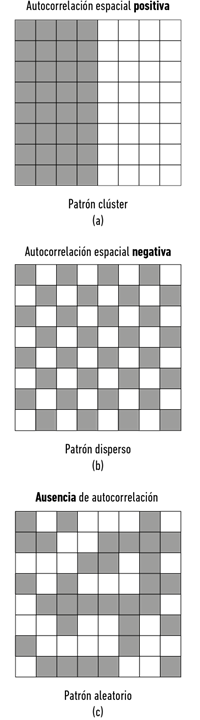

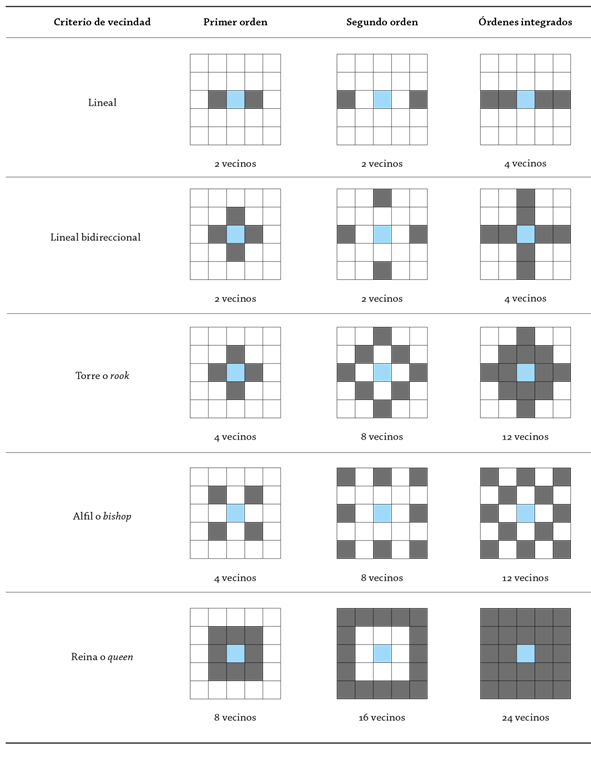

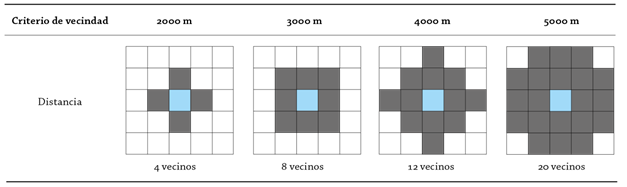

<a href="https://doi.org/10.15446/rcdg.v28n1.76919">La autocorrelación espacial y el desarrollo de la geografía cuantitativa</a>

<font style="font-size:2em; color:green">2. Índice de Moran Local</font>

El I de Moran local es una estadística espacial inferencial que se utiliza para calcular autocorrelación Para $n$ objetos espaciales en una vecindad. Este índice se emplea para para identificar si existe una agrupación de valores altos o bajos y para rastrear valores atípicos espaciales. Matemáticamente se describe como:

$
I_i = \frac{x_{i} - \bar X}{m_2} \sum_{j} w_{ij} (x_{j} - \bar X)
$

$
m_2 = \frac{\sum_{i} (x_j - \bar X)^2}{n}
$

$n$: número total de observaciones <br>
$x_i$: valor de la característica $i$ <br>
$x_j$: valor de la característica $j$ <br>
$\bar X$: promedio de todos los atributos <br>
$w_{ij}$: pesos entre las característica $i$ y $j$
$m_2$: constante para todas las ubicaciones. Es una estimación consistente pero no insesgada de la varianza

# EJEMPLO:

In [6]:
geodatasets.data

{'geoda': {'airbnb': {'url': 'https://geodacenter.github.io/data-and-lab//data/airbnb.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.airbnb',
   'description': 'Airbnb rentals, socioeconomics, and crime in Chicago',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//airbnb/',
   'hash': 'a2ab1e3f938226d287dd76cde18c00e2d3a260640dd826da7131827d9e76c824',
   'filename': 'airbnb.zip'},
  'atlanta': {'url': 'https://geodacenter.github.io/data-and-lab//data/atlanta_hom.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.atlanta',
   'description': 'Atlanta, GA region homicide counts and rates',
   'geometry_type': 'Polygon',
   'nrows': 90,
   'ncols': 24,
   'details': 'https://geodacenter.github.io/data-and-lab//atlanta_old/',
   'hash': 'a33a76e12168fe84361e60c88a9df4856730487305846c559715c89b1a2b5e09',
   'filename': 'atlanta_hom.zip',
   'members': ['atlanta_hom/atl_hom.geojson']},
  'cars': {'url': 'https://geodacenter.github.io/data-and-lab//data/Abandoned_Vehicles_Map.csv',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.cars',
   'description': '2011 abandoned vehicles in Chicago (311 complaints).',
   'geometry_type': 'Point',
   'nrows': 137867,
   'ncols': 21,
   'details': 'https://geodacenter.github.io/data-and-lab//1-source-and-description/',
   'hash': '6a0b23bc7eda2dcf1af02d43ccf506b24ca8d8c6dc2fe86a2a1cc051b03aae9e',
   'filename': 'Abandoned_Vehicles_Map.csv'},
  'charleston1': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston1',
   'description': '2000 Census Tract Data for Charleston, SC MSA and counties',
   'geometry_type': 'Polygon',
   'nrows': 117,
   'ncols': 31,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston-1_old/',
   'hash': '4a4fa9c8dd4231ae0b2f12f24895b8336bcab0c28c48653a967cffe011f63a7c',
   'filename': 'CharlestonMSA.zip',
   'members': ['CharlestonMSA/sc_final_census2.gpkg']},
  'charleston2': {'url': 'https://geodacenter.github.io/data-and-lab//data/CharlestonMSA2.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.charleston2',
   'description': '1998 and 2001 Zip Code Business Patterns (Census Bureau) for Charleston, SC MSA',
   'geometry_type': 'Polygon',
   'nrows': 42,
   'ncols': 60,
   'details': 'https://geodacenter.github.io/data-and-lab//charleston2/',
   'hash': '056d5d6e236b5bd95f5aee26c77bbe7d61bd07db5aaf72866c2f545205c1d8d7',
   'filename': 'CharlestonMSA2.zip',
   'members': ['CharlestonMSA2/CharlestonMSA2.gpkg']},
  'chicago_health': {'url': 'https://geodacenter.github.io/data-and-lab//data/comarea.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_health',
   'description': 'Chicago Health + Socio-Economics',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 87,
   'details': 'https://geodacenter.github.io/data-and-lab//comarea_vars/',
   'hash': '4e872adb552786eae2fcd745524696e5e4cd33cc9a6c032471c0e75328871401',
   'filename': 'comarea.zip'},
  'chicago_commpop': {'url': 'https://geodacenter.github.io/data-and-lab//data/chicago_commpop.zip',
   'license': 'NA',
   'attribution': 'Center for Spatial Data Science, University of Chicago',
   'name': 'geoda.chicago_commpop',
   'description': 'Chicago Community Area Population Percent Change for 2000 and 2010',
   'geometry_type': 'Polygon',
   'nrows': 77,
   'ncols': 9,
   'details': 'https://geodacenter.github.io/data-and-lab//commpop/',
   'hash': '1dbebb50c8ea47e2279ea819ef64ba793bdee2b88e4716bd6c6ec0e0d8e0e05b',
   'filename': 'c

In [7]:
NYeducation = geodatasets.get_path("geoda_nyc_education")

In [8]:
NYeducation = gpd.read_file(NYeducation)

In [9]:
NYeducation.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2216 entries, 0 to 2215
Data columns (total 57 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   POLY_ID     2216 non-null   float64 
 1   YOUTH_DROP  2216 non-null   float64 
 2   PER_MNRTY   2216 non-null   float64 
 3   HS_DROP     2216 non-null   float64 
 4   COL_DEGREE  2216 non-null   float64 
 5   PER_ASIAN   2216 non-null   float64 
 6   PER_WHITE   2216 non-null   float64 
 7   PER_BLACK   2216 non-null   float64 
 8   CTLabel     2216 non-null   object  
 9   BoroCode    2216 non-null   object  
 10  BoroName    2216 non-null   object  
 11  CT2000      2216 non-null   object  
 12  BoroCT2000  2216 non-null   object  
 13  NTACode     2216 non-null   object  
 14  NTANAme     2216 non-null   object  
 15  PUMA        2216 non-null   object  
 16  Shape_Leng  2216 non-null   float64 
 17  Shape_Area  2216 non-null   float64 
 18  NP_CT       2216 non-null   float64 
 19

In [10]:
NYeducation.insert(1,"X",NYeducation.centroid.x)
NYeducation.insert(2,"Y",NYeducation.centroid.y)
NYeducation.head(2)
#NYeducation.centroid.x

,POLY_ID,X,Y,YOUTH_DROP,PER_MNRTY,HS_DROP,COL_DEGREE,PER_ASIAN,PER_WHITE,PER_BLACK,...,black,asian,sub18,GENDER_PAR,male,female,SCHOOL_CT,popdens,population,geometry
0,1.0,988765.573063,203615.644187,0.000000,0.23,0.17,0.51,0.12,0.77,0.04,...,321.0,944.0,540.0,0.9817,3971.0,4045.0,2,95199.27,8016.0,"POLYGON ((989819.296 204093.995, 989701.137 20..."
1,2.0,989389.224829,204873.072108,0.121951,0.32,0.16,0.53,0.11,0.68,0.05,...,328.0,738.0,589.0,1.1117,3454.0,3107.0,2,107889.40,6561.0,"POLYGON ((990340.007 205029.463, 990332.127 20..."


In [11]:
NYeducation.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [12]:
NYeducation=NYeducation.to_crs("3395")

In [13]:
Educacion = NYeducation.iloc[:,[0,1,2,44,58]]
Educacion.crs

<Projected CRS: EPSG:3395>
Name: WGS 84 / World Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World between 80°S and 84°N.
- bounds: (-180.0, -80.0, 180.0, 84.0)
Coordinate Operation:
- name: World Mercator
- method: Mercator (variant A)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [14]:
Educacion=Educacion.set_index("POLY_ID", drop=False)

In [15]:
NYeducation.head(2)

,POLY_ID,X,Y,YOUTH_DROP,PER_MNRTY,HS_DROP,COL_DEGREE,PER_ASIAN,PER_WHITE,PER_BLACK,...,black,asian,sub18,GENDER_PAR,male,female,SCHOOL_CT,popdens,population,geometry
0,1.0,988765.573063,203615.644187,0.000000,0.23,0.17,0.51,0.12,0.77,0.04,...,321.0,944.0,540.0,0.9817,3971.0,4045.0,2,95199.27,8016.0,"POLYGON ((-8235405.521 4944252.752, -8235452.9..."
1,2.0,989389.224829,204873.072108,0.121951,0.32,0.16,0.53,0.11,0.68,0.05,...,328.0,738.0,589.0,1.1117,3454.0,3107.0,2,107889.40,6561.0,"POLYGON ((-8235196.293 4944628.421, -8235199.4..."


<Axes: >

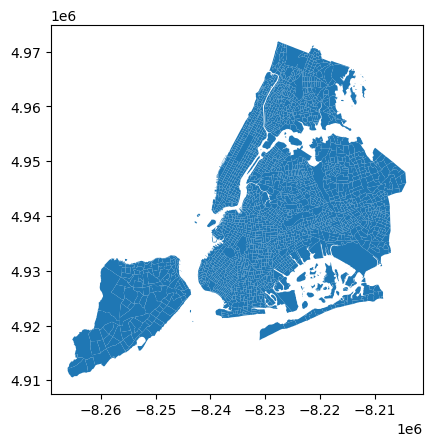

In [16]:
Educacion.plot()

In [17]:
pesos = weights.KNN.from_dataframe(Educacion,k=15)
pesos

In [18]:
pesos.transform = "R"

In [19]:
Educacion.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Float64Index: 2216 entries, 1.0 to 2216.0
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   POLY_ID   2216 non-null   float64 
 1   X         2216 non-null   float64 
 2   Y         2216 non-null   float64 
 3   college   2216 non-null   float64 
 4   geometry  2216 non-null   geometry
dtypes: float64(4), geometry(1)
memory usage: 103.9 KB


In [20]:
#Educacion["college"] = Educacion["college"].astype(int)
Educacion["college"] = Educacion["college"]

In [21]:
Educacion["college"]

POLY_ID
1.0       3406.0
2.0       2736.0
3.0       4011.0
4.0       2883.0
5.0        121.0
           ...  
2212.0     435.0
2213.0     199.0
2214.0     118.0
2215.0     112.0
2216.0     131.0
Name: college, Length: 2216, dtype: float64

In [22]:
#y = np.log(Educacion["college"])
y = Educacion["college"]
y

POLY_ID
1.0       3406.0
2.0       2736.0
3.0       4011.0
4.0       2883.0
5.0        121.0
           ...  
2212.0     435.0
2213.0     199.0
2214.0     118.0
2215.0     112.0
2216.0     131.0
Name: college, Length: 2216, dtype: float64

In [23]:
Educacion["lag"] = weights.lag_spatial(pesos,y)

In [24]:
Educacion.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Float64Index: 2216 entries, 1.0 to 2216.0
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   POLY_ID   2216 non-null   float64 
 1   X         2216 non-null   float64 
 2   Y         2216 non-null   float64 
 3   college   2216 non-null   float64 
 4   geometry  2216 non-null   geometry
 5   lag       2216 non-null   float64 
dtypes: float64(5), geometry(1)
memory usage: 121.2 KB


In [25]:
IM = esda.Moran(Educacion["lag"],pesos)
IM

In [26]:
IM.I

0.9153011557150017

In [27]:
IM.p_sim

0.001

In [28]:
IM.z_sim

118.55168738958096

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.92)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

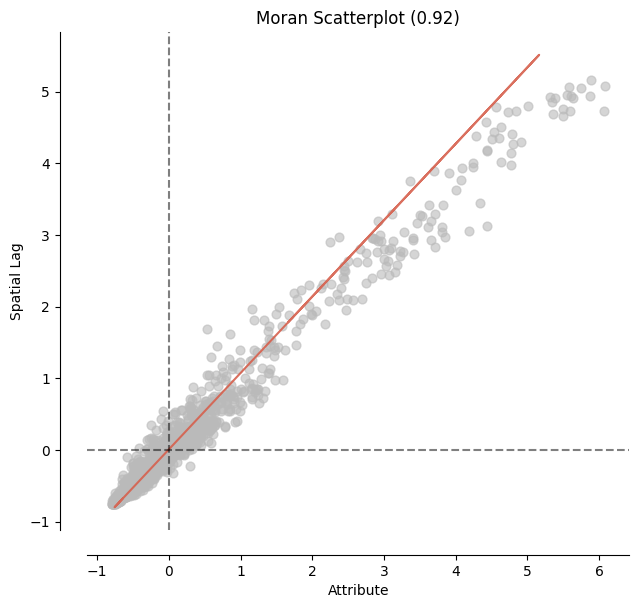

In [29]:
moran_scatterplot(IM)

<Axes: >

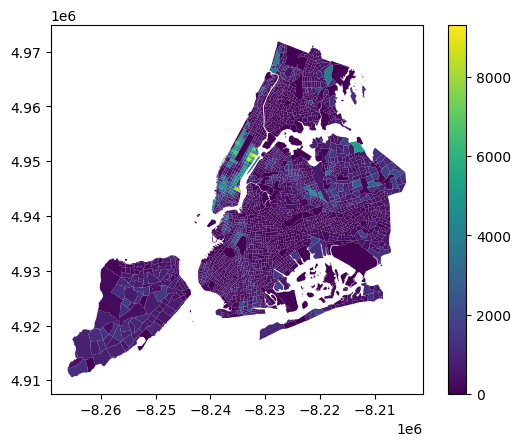

In [30]:
Educacion.plot("college", legend=True)

In [31]:
NYeducation.explore("college")

In [32]:
IMlocal = esda.Moran_Local(Educacion["lag"],pesos)

In [33]:
Educacion["Significativo"] = IMlocal.p_sim < 0.05

In [34]:
Educacion["Cuadrante"] = IMlocal.q

In [35]:
Educacion["Significativo"]

POLY_ID
1.0        True
2.0        True
3.0        True
4.0        True
5.0        True
          ...  
2212.0     True
2213.0    False
2214.0     True
2215.0     True
2216.0     True
Name: Significativo, Length: 2216, dtype: bool

In [36]:
NYeducation.NTANAme[NYeducation["POLY_ID"]==2013.0]

2012    Claremont-Bathgate
Name: NTANAme, dtype: object

<Axes: >

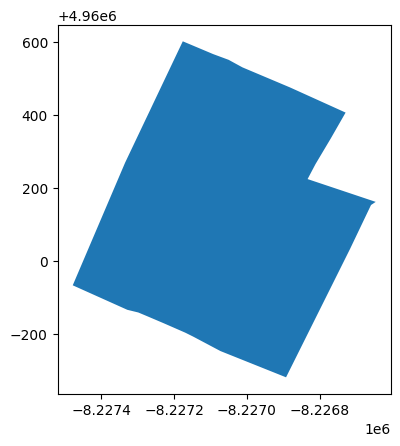

In [37]:
NYeducation[NYeducation["POLY_ID"]==2013.0].plot()

In [38]:
NYeducation[NYeducation["POLY_ID"]==2013.0].explore()

<Axes: >

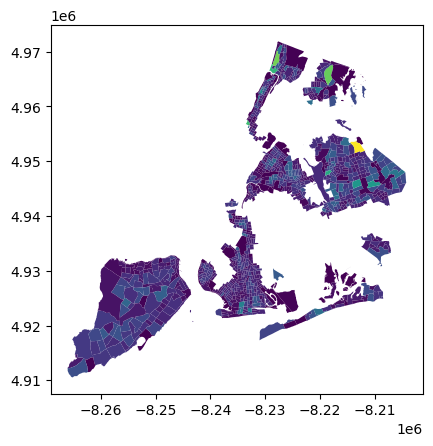

In [39]:
Educacion[Educacion["Significativo"]==False].plot("college")

(<Figure size 640x480 with 1 Axes>, <Axes: >)

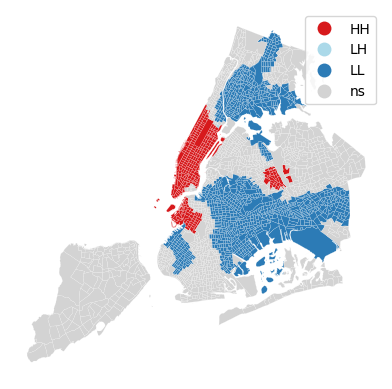

In [40]:
lisa_cluster(IMlocal,Educacion)